In [1]:
nums = [1,2,3,1]
s = set(nums)
s

{1, 2, 3}

In [1]:
import pickle,gzip,math,os,time,shutil,torch,random,timm,torchvision,io,PIL
import fastcore.all as fc,matplotlib as mpl,numpy as np,matplotlib.pyplot as plt
from collections.abc import Mapping
from pathlib import Path
from operator import attrgetter,itemgetter
from functools import partial
from copy import copy
from contextlib import contextmanager

import torchvision.transforms.functional as TF,torch.nn.functional as F
from torchvision import transforms
from torch import tensor,nn,optim
from torch.utils.data import DataLoader,default_collate
from torch.nn import init
from torch.optim import lr_scheduler
from torcheval.metrics import MulticlassAccuracy
from datasets import load_dataset,load_dataset_builder
from fastcore.foundation import L, store_attr

from miniai.datasets import *
from miniai.conv import *
from miniai.learner import *
from miniai.activations import *
from miniai.init import *
from miniai.sgd import *
from miniai.resnet import *

from PIL import Image

In [4]:
clean_mem()

In [5]:
# Image URLs for demos. Change as desired.
face_url = "https://images.pexels.com/photos/2690323/pexels-photo-2690323.jpeg?w=256"
spiderweb_url = "https://images.pexels.com/photos/34225/spider-web-with-water-beads-network-dewdrop.jpg?w=256"

In [6]:
def download_image(url):
    imgb = fc.urlread(url, decode=False) 
    return torchvision.io.decode_image(tensor(list(imgb), dtype=torch.uint8)).float()/255.

content_im.shape: torch.Size([3, 256, 256])


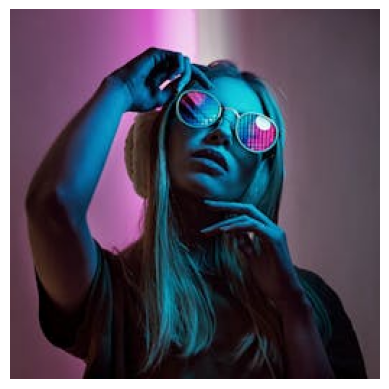

In [7]:
content_im = download_image(face_url).to(def_device)
print('content_im.shape:', content_im.shape)
show_image(content_im);

In [8]:
class LengthDataset():
    def __init__(self, length=1): self.length=length
    def __len__(self): return self.length
    def __getitem__(self, idx): return 0,0

def get_dummy_dls(length=100):
    return DataLoaders(DataLoader(LengthDataset(length), batch_size=1), # Train
                       DataLoader(LengthDataset(1), batch_size=1))      # Valid (length 1)

A simple model that can be trained to generate a specific image from noise. The parameters to be trained in this model are just the pixel values of the image.

In [9]:
class TensorModel(nn.Module):
    def __init__(self, t):
        super().__init__()
        self.t = nn.Parameter(t.clone())
    def forward(self, x=0): return self.t

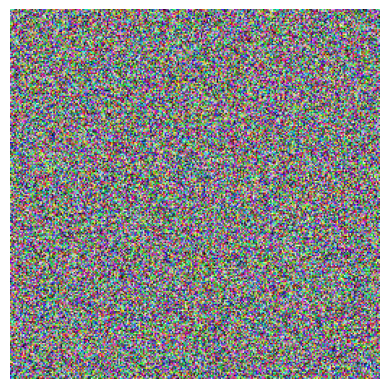

In [7]:
model = TensorModel(torch.rand_like(content_im))
show_image(model());

In [8]:
[p.shape for p in model.parameters()]

[torch.Size([3, 256, 256])]

Call back class for the Learner to work with this type of model

In [10]:
class ImageOptCB(TrainCB):
    def predict(self, learn): learn.preds = learn.model()
    def get_loss(self, learn): learn.loss = learn.loss_func(learn.preds)

In [11]:
def loss_fn_mse(im):
    return F.mse_loss(im, content_im)

model = TensorModel(torch.rand_like(content_im))
cbs = [ImageOptCB(), ProgressCB(), MetricsCB(), DeviceCB()]
learn = Learner(model, get_dummy_dls(100), loss_fn_mse, 
                lr=1e-2, cbs=cbs, opt_func=torch.optim.Adam)
learn.fit(1)

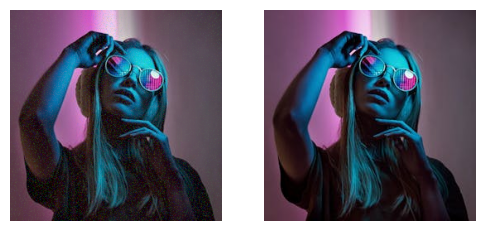

In [11]:
# Result (left) vs target image (right):
show_images([learn.model().clip(0, 1), content_im]);

Callback to visualize the pixel value updates over time 

In [12]:
class ImageLogCB(Callback):
    order = ProgressCB.order + 1
    def __init__(self, log_every=10): store_attr(); self.images=[]; self.i=0
    def after_batch(self, learn): 
        if self.i%self.log_every == 0: self.images.append(to_cpu(learn.preds.clip(0, 1)))
        self.i += 1
    def after_fit(self, learn): show_images(self.images)

loss,epoch,train
0.028,0,train
0.000,0,eval


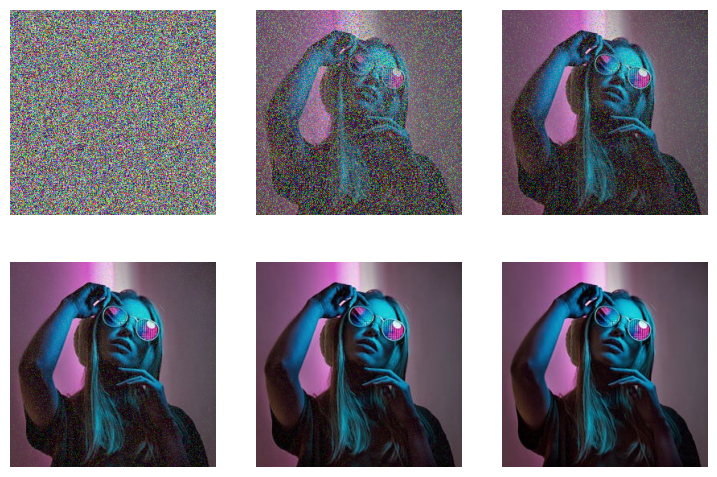

In [13]:
model = TensorModel(torch.rand_like(content_im))
learn = Learner(model, get_dummy_dls(150), loss_fn_mse, 
                lr=1e-2, cbs=cbs, opt_func=torch.optim.Adam)
learn.fit(1, cbs=[ImageLogCB(30)])

## Style transfer

![vgg diag](https://neurohive.io/wp-content/uploads/2018/11/vgg16-1-e1542731207177.png)

Extracting features from VGG16 for capturing the "artistic" style of the target image

In [13]:
vgg16 = timm.create_model('vgg16', pretrained=True).to(def_device).features

In [15]:
vgg16

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (17): Conv2d(256, 512, kernel_si

VGG16 was trained on ImageNet dataset with normalization along each color channel.
So in order to use the model to extract features, we need to normalize the input image with the mean and standard deviation of the ImageNet dataset (hardcoded in the following cell)

In [14]:
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

In [15]:
normalize(content_im).min(), normalize(content_im).max()

(tensor(-2.1179, device='cuda:0'), tensor(2.6400, device='cuda:0'))

Function to extract features captured in intermediate layers:

In [16]:
def calc_features(imgs, target_layers=(18, 25)): 
    x = normalize(imgs)
    feats = []
    for i, layer in enumerate(vgg16[:max(target_layers)+1]):
        x = layer(x)
        if i in target_layers:
            feats.append(x.clone())
    return feats

In [19]:
feats = calc_features(content_im)
[f.shape for f in feats]

[torch.Size([512, 32, 32]), torch.Size([512, 16, 16])]

Creating a loss function to capture the structure of the original image (Content/Perceptual loss)

In [17]:
class ContentLossToTarget():
    def __init__(self, target_im, target_layers=(18, 25)):
        fc.store_attr()
        with torch.no_grad():
            self.target_features = calc_features(target_im, target_layers)
    def __call__(self, input_im): 
        return sum((f1-f2).pow(2).mean() for f1, f2 in 
               zip(calc_features(input_im, self.target_layers), self.target_features))

loss,epoch,train
4.713,0,train
1.445,0,eval


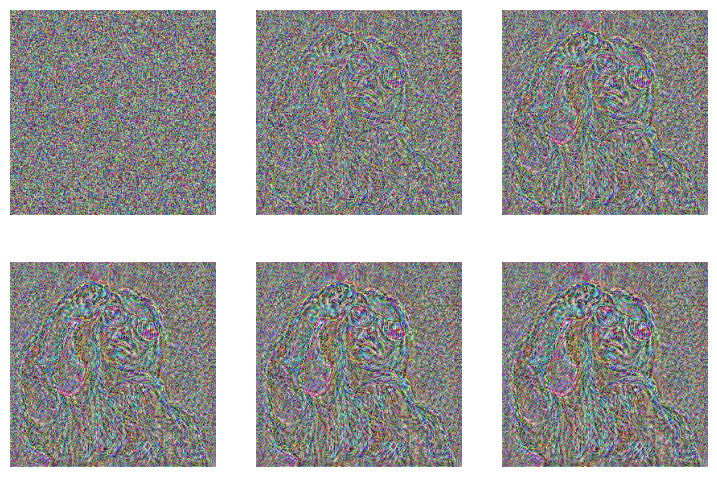

In [21]:
loss_function_perceptual = ContentLossToTarget(content_im)
model = TensorModel(torch.rand_like(content_im))
learn = Learner(model, get_dummy_dls(150), loss_function_perceptual, 
                lr=1e-2, cbs=cbs, opt_func=torch.optim.Adam)
learn.fit(1, cbs=[ImageLogCB(log_every=30)])

Selecting earlier layers to capture more of the textures of the original image

loss,epoch,train
2.349,0,train
0.360,0,eval


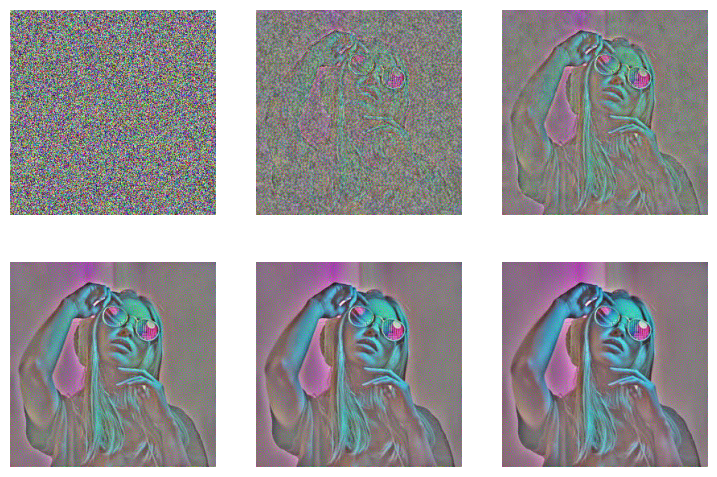

In [22]:
loss_function_perceptual = ContentLossToTarget(content_im, target_layers=(1, 6))
model = TensorModel(torch.rand_like(content_im))
learn = Learner(model, get_dummy_dls(150), loss_function_perceptual, 
                lr=1e-2, cbs=cbs, opt_func=torch.optim.Adam)
learn.fit(1, cbs=[ImageLogCB(log_every=30)])

Creating the "Style Loss" using the features of the target image

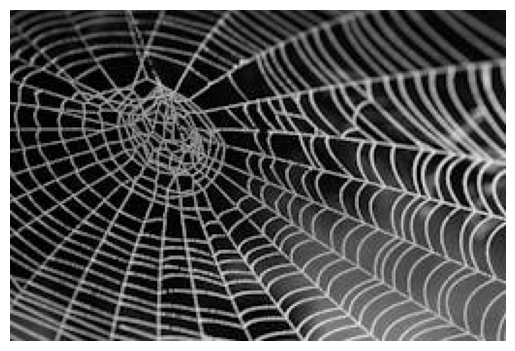

In [48]:
style_im = download_image(spiderweb_url).to(def_device)
show_image(style_im);

Creating Gram matrix of the target to evaluate if an image has the "style" features of the target image

In [19]:
def calc_grams(img, target_layers=(1, 6, 11, 18, 25)):
    return L(torch.einsum('chw, dhw -> cd', x, x) / (x.shape[-2]*x.shape[-1]) # 'bchw, bdhw -> bcd' if batched
            for x in calc_features(img, target_layers))

In [25]:
style_grams = calc_grams(style_im)
[g.shape for g in style_grams]

[torch.Size([64, 64]),
 torch.Size([128, 128]),
 torch.Size([256, 256]),
 torch.Size([512, 512]),
 torch.Size([512, 512])]

In [20]:
class StyleLossToTarget():
    def __init__(self, target_im, target_layers=(1, 6, 11, 18, 25)):
        fc.store_attr()
        with torch.no_grad(): self.target_grams = calc_grams(target_im, target_layers)
    def __call__(self, input_im): 
        return sum((f1-f2).pow(2).mean() for f1, f2 in 
               zip(calc_grams(input_im, self.target_layers), self.target_grams))

In [27]:
style_loss = StyleLossToTarget(style_im)
# style loss is high because the input image is completely different from the style image
style_loss(content_im)

tensor(429.7724, device='cuda:0', grad_fn=<AddBackward0>)

## Creating the style transfer model

loss,epoch,train
75.825,0,train
45.188,0,eval


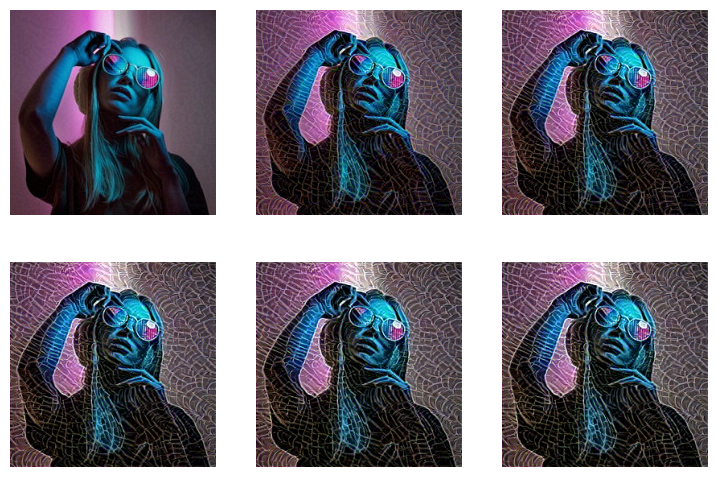

In [28]:
model = TensorModel(content_im) # Start from content image
style_loss = StyleLossToTarget(style_im)
content_loss = ContentLossToTarget(content_im)
def combined_loss(x):
    return style_loss(x) + content_loss(x)
learn = Learner(model, get_dummy_dls(150), combined_loss, lr=1e-2, cbs=cbs, opt_func=torch.optim.Adam)
learn.fit(1, cbs=[ImageLogCB(30)])

In [21]:
def styletransfer(input, target, content_loss_weight=1, style_loss_weight=1, iter=150, log_interval=5):
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    normalize(input)
    normalize(target)
    model = TensorModel(input)
    style_loss = StyleLossToTarget(target)
    content_loss = ContentLossToTarget(input)
    def combined_loss(x):
        return style_loss(x) * style_loss_weight + content_loss(x) * content_loss_weight
    learn = Learner(model, get_dummy_dls(iter), combined_loss, lr=1e-2, cbs=cbs, opt_func=torch.optim.Adam)
    learn.fit(1, cbs=[ImageLogCB(iter/log_interval)])
    return learn.model()

In [22]:
def load_image_to_tensor(filepath):
    # Open the image file
    with Image.open(filepath) as img:
        # Convert the image to a tensor
        tensor_transform = transforms.ToTensor()
        image_tensor = tensor_transform(img)
    return image_tensor.to(def_device)

torch.Size([3, 1440, 2560])


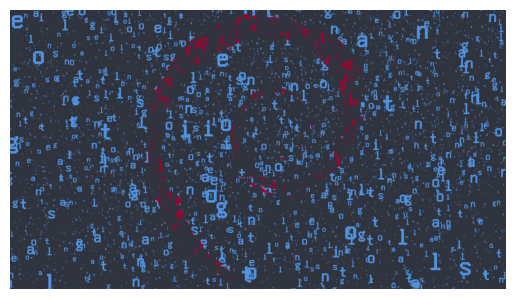

In [51]:
target_path = "p2.jpg"
target = load_image_to_tensor(target_path)
# target = transforms.Resize((256, 256))(target)
show_image(target);
print(target.shape)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


torch.Size([3, 256, 256])


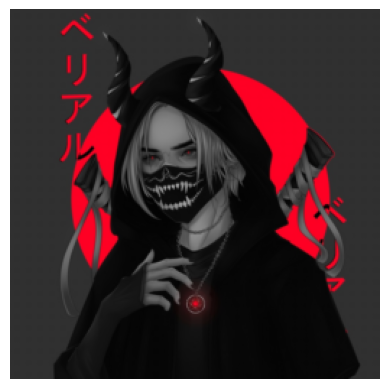

In [52]:
input_path = "og2.jpg"
input = load_image_to_tensor(input_path)
input = transforms.Resize((256, 256))(input)
show_image(input);
print(input.shape)

loss,epoch,train
4.978,0,train
3.999,0,eval


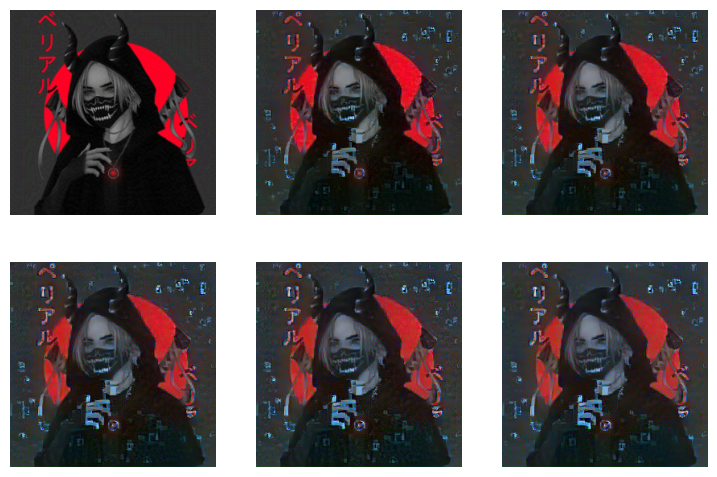

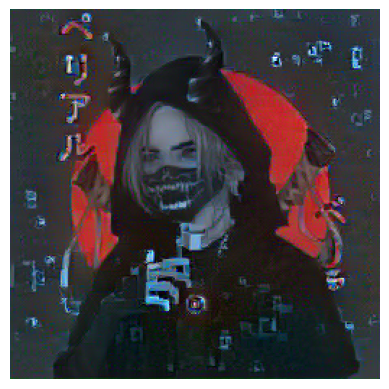

In [54]:
model = styletransfer(input, target, content_loss_weight=.25, style_loss_weight=1, iter=1000)
show_image(model.clip(0, 1));

loss,epoch,train
78.212,0,train
49.976,0,eval


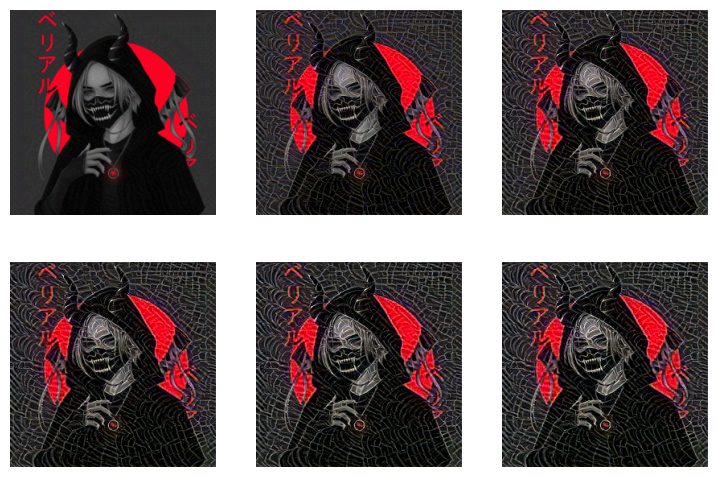

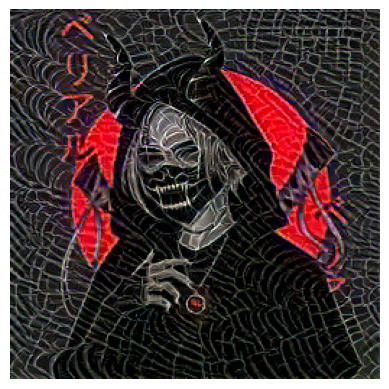

In [26]:
model = styletransfer(input, style_im, content_loss_weight=1, style_loss_weight=1, iter=150)
show_image(model.clip(0, 1));

torch.Size([3, 934, 1160])


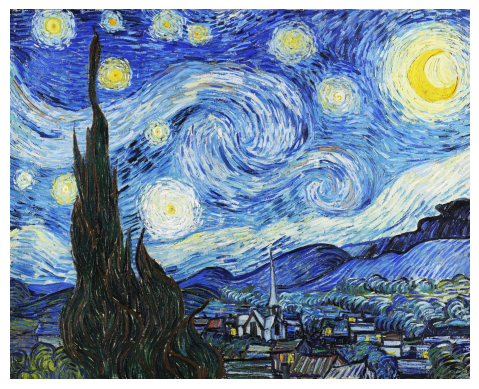

In [46]:
target_path = "p3.jpg"
target = load_image_to_tensor(target_path)
show_image(target);
print(target.shape)

In [31]:
torch.cuda.empty_cache()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


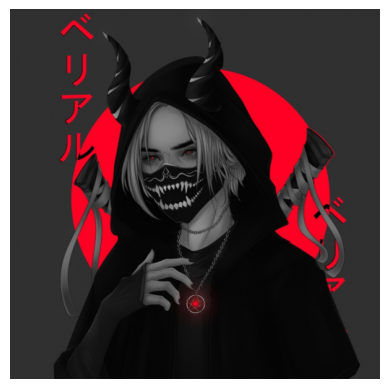

In [40]:
input = load_image_to_tensor("og2.jpg")
input = transforms.Resize((512, 512))(input)
show_image(input);

In [36]:
clean_mem()

loss,epoch,train
4.162,0,train
3.367,0,eval


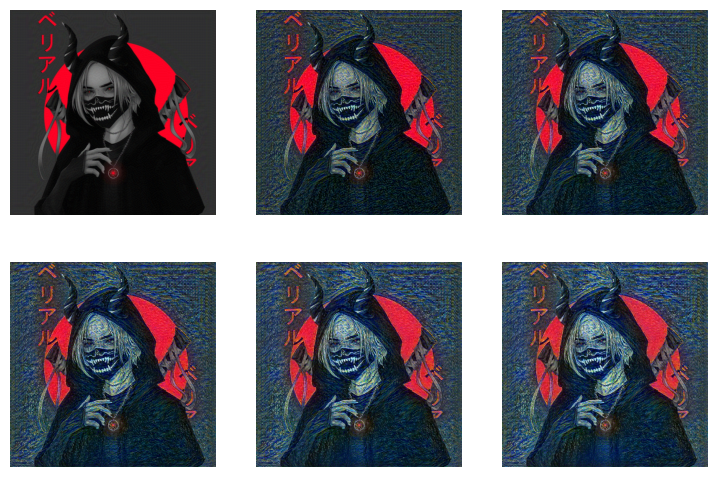

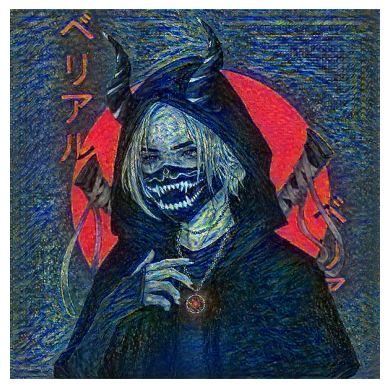

In [37]:
model = styletransfer(input, target, content_loss_weight=.5, style_loss_weight=1, iter=1000)
show_image(model.clip(0, 1));

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


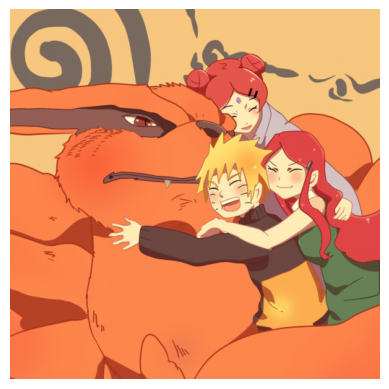

In [56]:
input = load_image_to_tensor("og4.jpg")
input = transforms.Resize((512, 512))(input)
show_image(input);

loss,epoch,train
77.684,0,train
50.423,0,eval


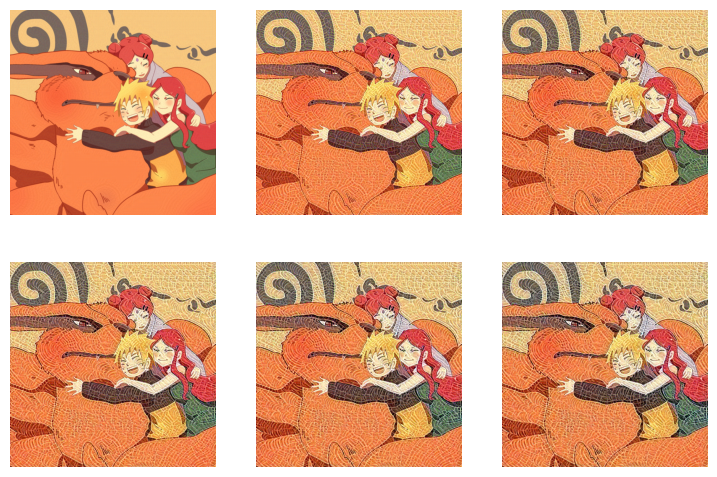

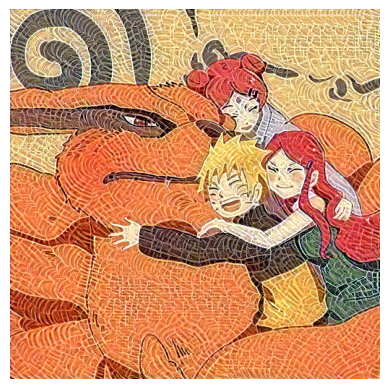

In [59]:
model = styletransfer(input, style_im, content_loss_weight=1, style_loss_weight=1, iter=200)
show_image(model.clip(0, 1));

In [58]:
clean_mem()